In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio

from keras.layers import Input, Conv2D, Flatten, InputLayer, Activation
from keras.models import Model, Sequential
from keras.layers.core import Dense, Dropout, Reshape
from keras.layers.advanced_activations import LeakyReLU
from keras.datasets import mnist
from keras.optimizers import Adam
from keras import initializers
from keras import backend as BK

Using TensorFlow backend.


In [2]:
# Let Keras know that we are using tensorflow as our backend engine
os.environ["KERAS_BACKEND"] = "tensorflow"
# To make sure that we can reproduce the experiment and get the same results
np.random.seed(10)
# The dimension of our random noise vector.
random_dim = 100

In [3]:
def load_dataset():
    files = []
    for r, d, f in os.walk('./emojies_face/'):
        for file in f:
            files.append(os.path.join(r, file))
    result = np.zeros((len(files),72,72,4))
    for i in range(0, len(files)):
        file = files[i]
        image = imageio.imread(file)
        result[i] = image
    result
    return result

In [4]:
def get_optimizer():
    return Adam(lr=0.0002, beta_1=0.5)

In [17]:
def get_generator(optimizer):
    
    def mapping_to_target_range( x, target_min=0, target_max=255):
        x02 = BK.tanh(x) + 1 # x in range(0,2)
        scale = ( target_max-target_min )/2.
        result = BK.round(x02 * scale + target_min)
        return result
    
    model = Sequential()
    model.add(Dense(256, input_dim=100, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(LeakyReLU(0.2))

    model.add(Dense(512))
    model.add(LeakyReLU(0.2))

    model.add(Dense(1024))
    model.add(LeakyReLU(0.2))

    model.add(Dense(72*72*4))
    model.add(Activation('tanh'))
#     model.add(Activation(activation=mapping_to_target_range))
    
    model.add(Reshape(target_shape=(72,72,4)))
    
    model.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    return model

In [18]:
def get_discriminator(optimizer):
    
    input_shape = (72,72,4)
    dropout = 0.4
    
    discriminator = Sequential()

    discriminator.add(InputLayer(input_shape=input_shape, name="input_layer"))

    discriminator.add(Conv2D(filters=64 * 1, strides=2, kernel_size=3, padding="same"))
    discriminator.add(LeakyReLU(alpha=0.2))
    discriminator.add(Dropout(dropout))

    discriminator.add(Conv2D(filters=64 * 2, strides=2, kernel_size=3, padding="same"))
    discriminator.add(LeakyReLU(alpha=0.2))
    discriminator.add(Dropout(dropout))

    discriminator.add(Conv2D(filters=64 * 4, strides=2, kernel_size=3, padding="same"))
    discriminator.add(LeakyReLU(alpha=0.2))
    discriminator.add(Dropout(dropout))

    discriminator.add(Conv2D(filters=64 * 8, strides=2, kernel_size=3, padding="same"))
    discriminator.add(LeakyReLU(alpha=0.2))
    discriminator.add(Dropout(dropout))

    discriminator.add(Conv2D(filters=64 * 16, strides=2, kernel_size=3, padding="same"))
    discriminator.add(LeakyReLU(alpha=0.2))
    discriminator.add(Dropout(dropout))

    discriminator.add(Flatten())
    discriminator.add(Dense(1))
    discriminator.add(Activation('sigmoid'))

    discriminator.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5))
    
    return discriminator

In [19]:
def get_gan_network(discriminator, random_dim, generator, optimizer):
    # We initially set trainable to False since we only want to train either the 
    # generator or discriminator at a time
    discriminator.trainable = False
    # gan input (noise) will be 100-dimensional vectors
    gan_input = Input(shape=(random_dim,))
    # the output of the generator (an image)
    x = generator(gan_input)
    # get the output of the discriminator (probability if the image is real or not)
    gan_output = discriminator(x)
    gan = Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer=optimizer)
    return gan

In [33]:
def plot_generated_images(epoch, generator, examples=100, dim=(10, 10), figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=[examples, random_dim])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(examples, 72, 72, 4)
    
    generated_images = (255 * ( (generated_images + 1) / 2 ) ).astype('int')

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image_epoch_%d.png' % epoch)

In [34]:
def train(epochs=1, batch_size=128):
    # Get the training and testing data
    # x_train, y_train, x_test, y_test = load_minst_data()
    dataset = load_dataset()
    # Split the training data into batches of size 128
    batch_count = dataset.shape[0] / batch_size

    # Build our GAN netowrk
    adam = get_optimizer()
    generator = get_generator(adam)
    discriminator = get_discriminator(adam)
    gan = get_gan_network(discriminator, random_dim, generator, adam)

    for e in range(1, epochs+1):
        print('-'*15, 'Epoch %d' % e, '-'*15)
        for _ in range(0, int(batch_count)):
            # Get a random set of input noise and images
            noise = np.random.normal(0, 1, size=[batch_size, random_dim])
            image_batch = dataset[np.random.randint(0, dataset.shape[0], size=batch_size)]

            # Generate fake MNIST images
            generated_images = generator.predict(noise)
            generated_images = (255 * ( (generated_images + 1) / 2 ) ).astype('int')
            X = np.concatenate([image_batch, generated_images])

            # Labels for generated and real data
            y_dis = np.zeros(2*batch_size)
            # One-sided label smoothing
            y_dis[:batch_size] = 0.9

            # Train discriminator
            discriminator.trainable = True
            discriminator.train_on_batch(X, y_dis)

            # Train generator
            noise = np.random.normal(0, 1, size=[batch_size, random_dim])
            y_gen = np.ones(batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y_gen)

        if e == 1 or e % 10 == 0:
            plot_generated_images(e, generator)

--------------- Epoch 1 ---------------
--------------- Epoch 2 ---------------
--------------- Epoch 3 ---------------
--------------- Epoch 4 ---------------
--------------- Epoch 5 ---------------
--------------- Epoch 6 ---------------
--------------- Epoch 7 ---------------
--------------- Epoch 8 ---------------
--------------- Epoch 9 ---------------
--------------- Epoch 10 ---------------
--------------- Epoch 11 ---------------
--------------- Epoch 12 ---------------
--------------- Epoch 13 ---------------
--------------- Epoch 14 ---------------
--------------- Epoch 15 ---------------
--------------- Epoch 16 ---------------
--------------- Epoch 17 ---------------
--------------- Epoch 18 ---------------
--------------- Epoch 19 ---------------
--------------- Epoch 20 ---------------
--------------- Epoch 21 ---------------
--------------- Epoch 22 ---------------
--------------- Epoch 23 ---------------
--------------- Epoch 24 ---------------
--------------- Epoch 25 

--------------- Epoch 199 ---------------
--------------- Epoch 200 ---------------


/media/dsokolov/463bc025-e343-4d53-92e7-601c453125bc/data/projects/hello_gan/venv/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


--------------- Epoch 201 ---------------
--------------- Epoch 202 ---------------
--------------- Epoch 203 ---------------
--------------- Epoch 204 ---------------
--------------- Epoch 205 ---------------
--------------- Epoch 206 ---------------
--------------- Epoch 207 ---------------
--------------- Epoch 208 ---------------
--------------- Epoch 209 ---------------
--------------- Epoch 210 ---------------
--------------- Epoch 211 ---------------
--------------- Epoch 212 ---------------
--------------- Epoch 213 ---------------
--------------- Epoch 214 ---------------
--------------- Epoch 215 ---------------


KeyboardInterrupt: 

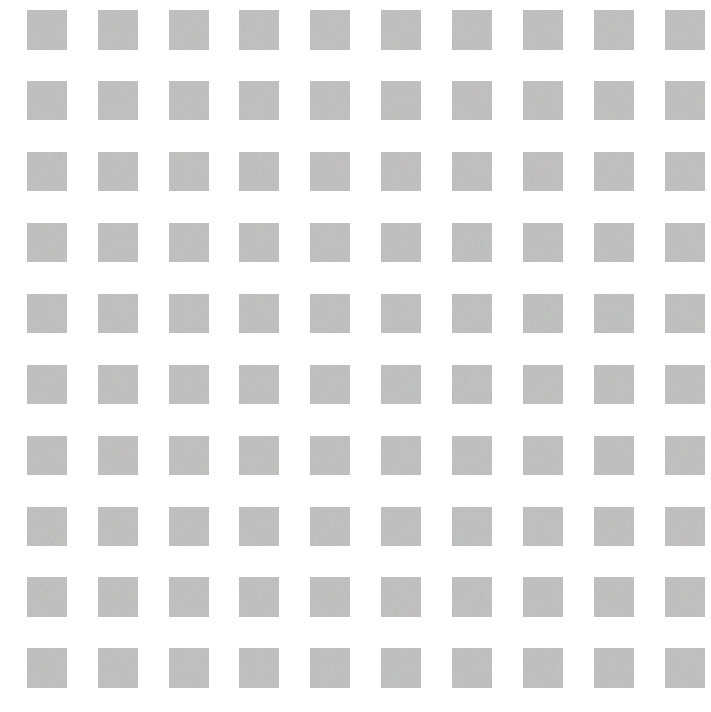

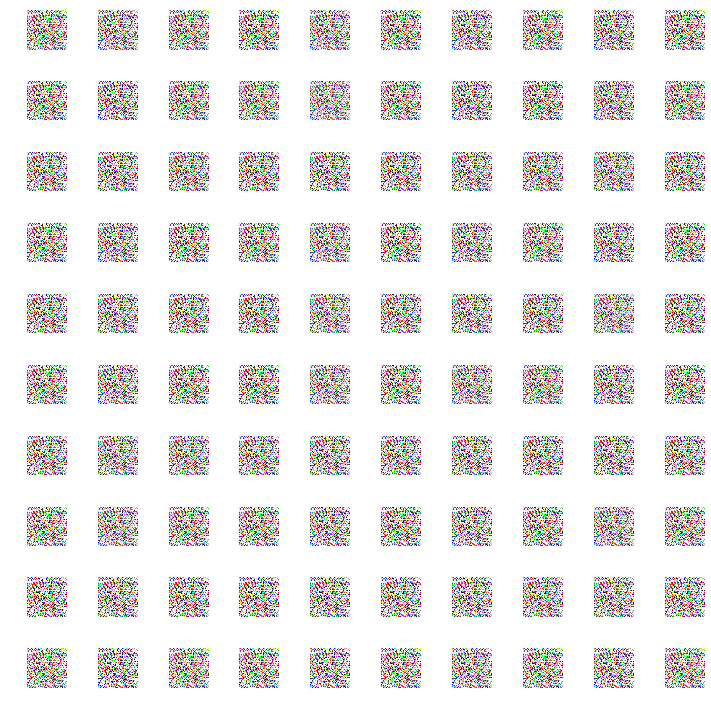

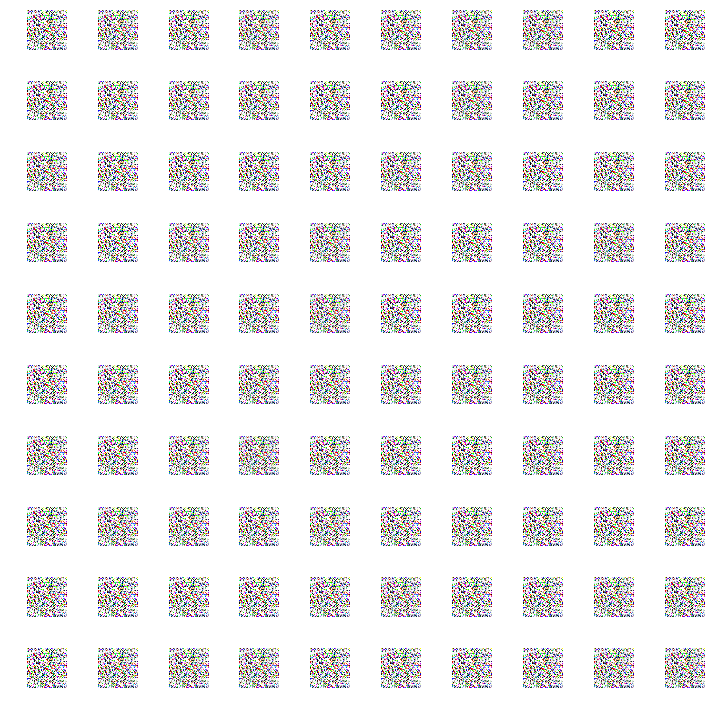

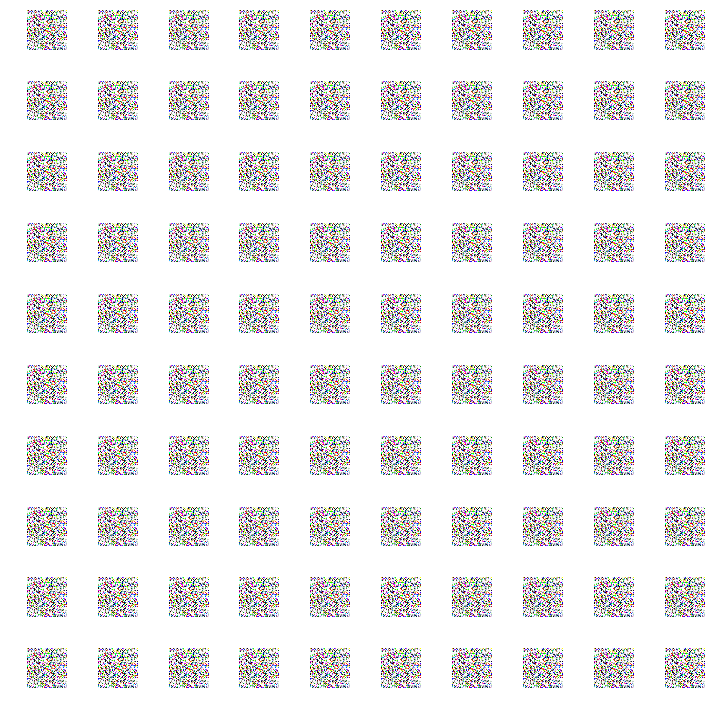

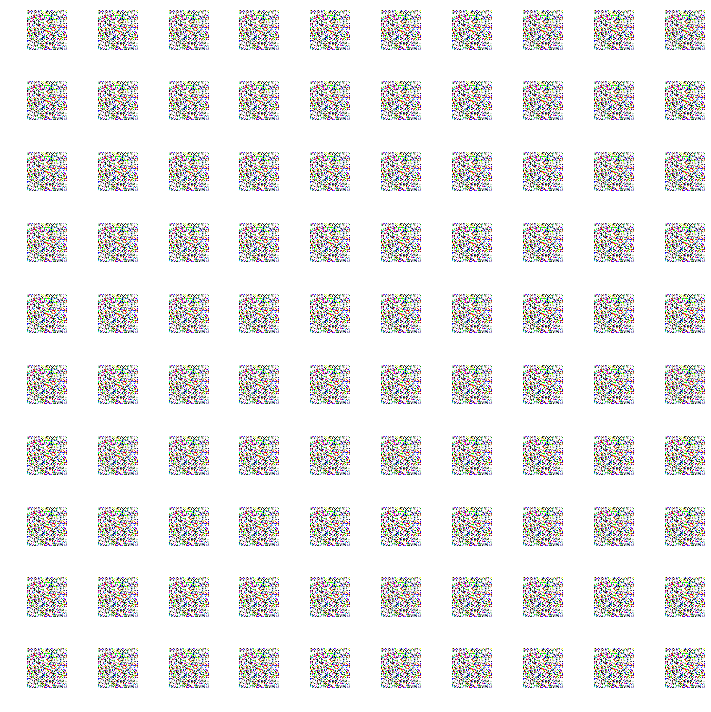

...

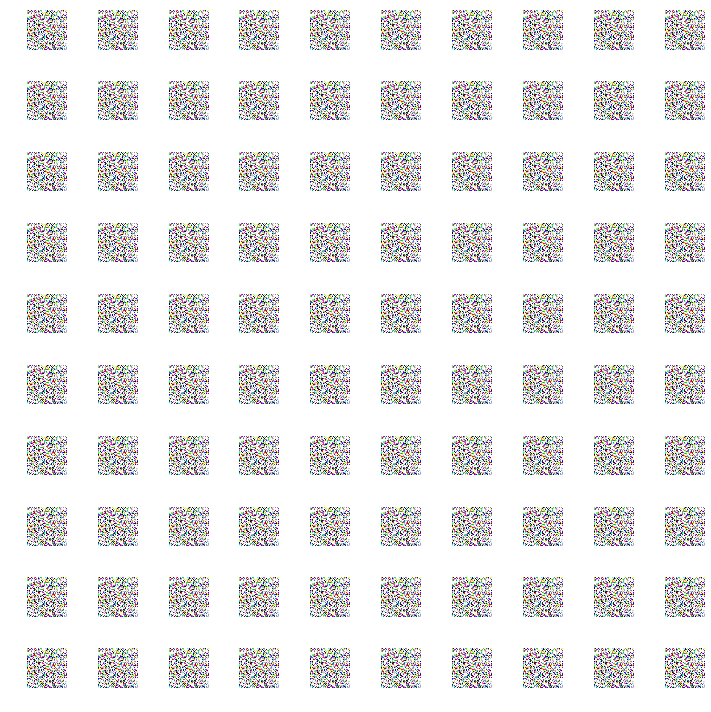

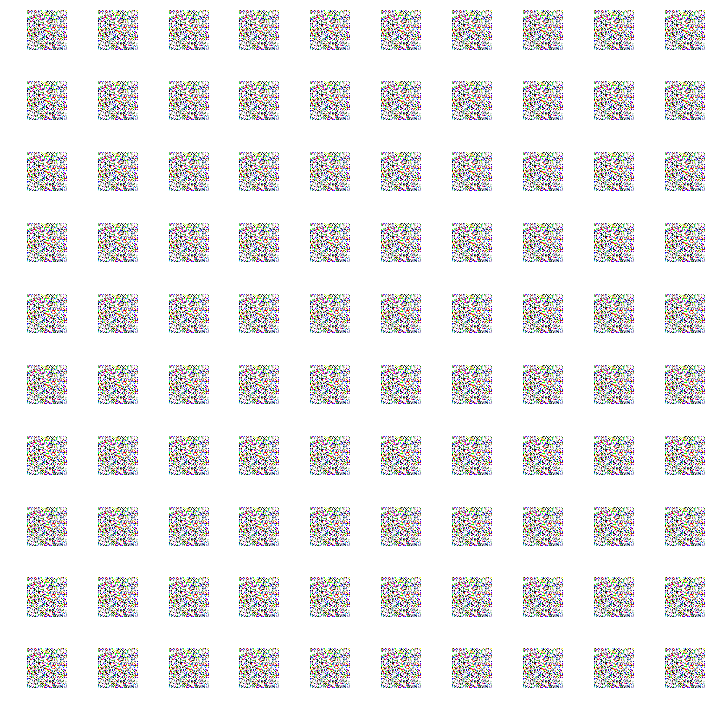

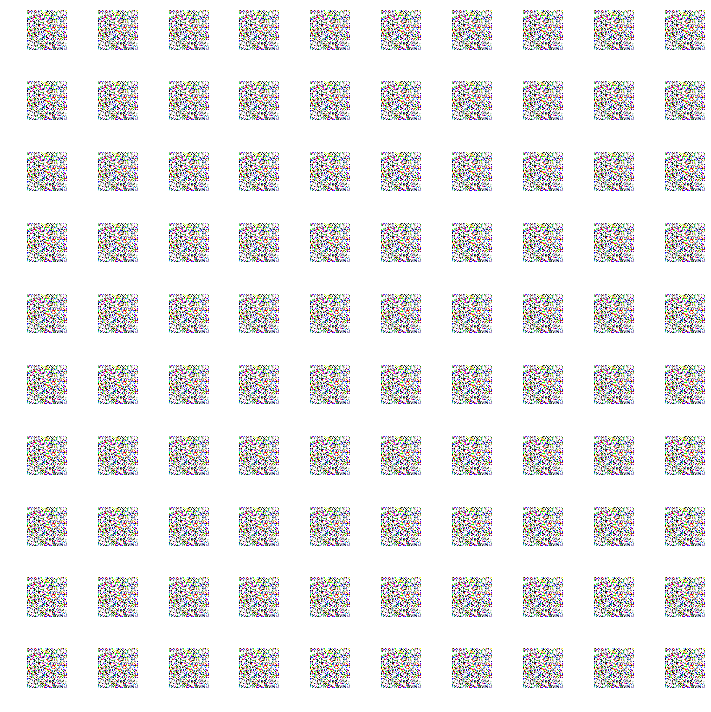

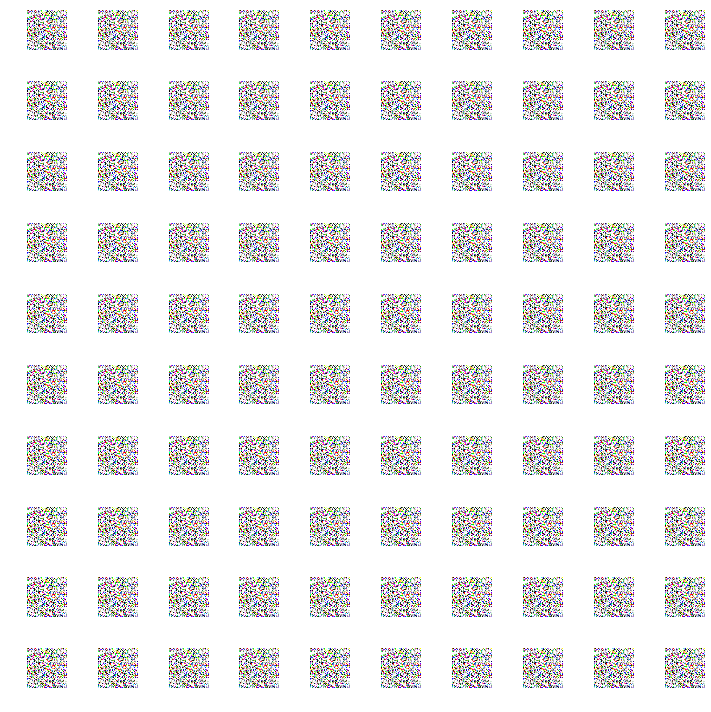

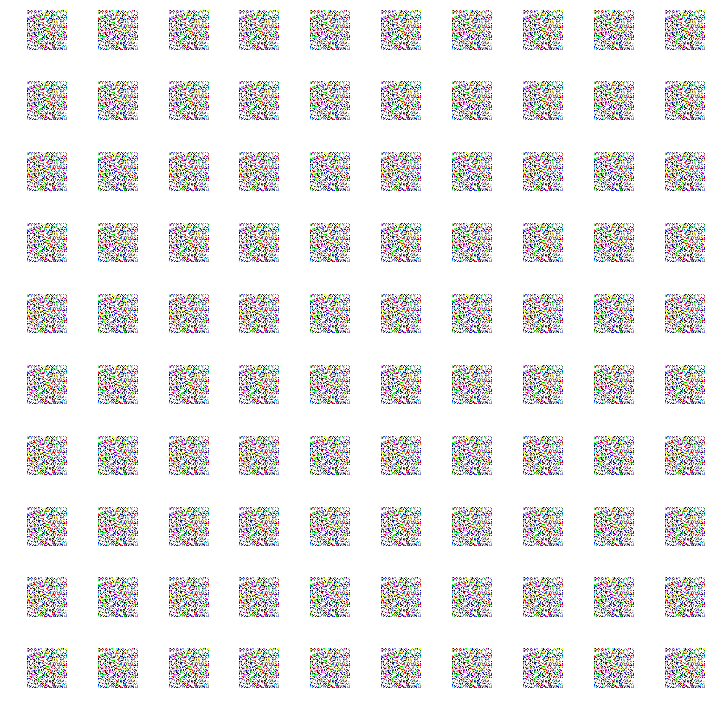

In [35]:
train(400, 20)